Following Notebook contains code for composing one image using style of another, using Deep Learning.
This technique used is known as Neural-Style Tranfer, and this technique is based on Research Paper ["Neural Algorithm of Artistic Style"](https://arxiv.org/abs/1508.06576).

The following code uses Tensoflow ( version : 2.0.0 ) along with other useful python libraries, which are compatible to current version of Tensorflow.

While there are a lot of resources, along with ready-made code availble for the following Algorithm, and different versions can be founded to suit the different needs, Still this project is a good way to grasp the knowledge about intrinsic details of how a CNN ( Convolutional Neural Network ) works and how it's properties can be used for salvaging different purposes, along with giving practical experience of working with Standard ML framework like Tensorflow, Pytorch, and many more.

The things I learned, while doing the project involves :
- Setting Up proper environment is must : due to installation of different packages with different versions, which were creating inconsistencies while setting up workspace for the project, ( and resulted in consumption of more time then required ).
- Working with Tensorflow, along with writing and deploying model.
- Comparing results, drawing inference from the model.

After running the code with 4 different optimisers ( here used Adam, Adamax, Nadam and RMSprop inbuilt optimisers ), Adam  is performing significantly better than other alternatives. due to better style acceptance in content image.

Code uses GPU ( while training, used 940MX as GPU )

In [1]:
# ALL REQUIRED PACKAGES IMPORTS
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
import IPython.display as display
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
# mpl.rcParams['figure.figsize'] = (12,12)
# mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools
import time

print("tensorflow version : ", tf.__version__)
print("keras version : ", tf.keras.__version__)
print("matplotlib version : ", matplotlib.__version__)
print("Numpy version : ", np.__version__)

tensorflow version :  2.0.0
keras version :  2.2.4-tf
matplotlib version :  3.1.1
Numpy version :  1.17.4


In [2]:
# variable containing path for image being used for style as well as for content
content_path = 'japanese_garden.jpg'
style_path = 'picasso_selfportrait.jpg'

In [3]:
# Utility funtion to convert an image-tensor into a usable image format
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
    tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

In [4]:
# Function to load image and setting it's dimension to 512 pixels
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
#     print(img)
    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    print(shape)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

In [5]:
# Utility function to load image and plotting it as graph
def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)

tf.Tensor([498. 960.], shape=(2,), dtype=float32)
tf.Tensor([600. 468.], shape=(2,), dtype=float32)


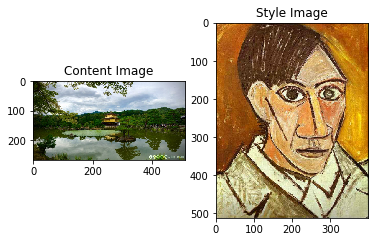

In [6]:
# Loading sample Images (Both Content and Style Image) for visualiation using above functions
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')


According to original paper by Leon, Alexander and Matthias, they have used VGG model ( CNN model being trained on ImageNet Database, for image classification of upto 1000 different classes ) in Caffe, to obtain result and to draw conclusions.

Here, we have used pre-defined VGG19 Model, (there are apparently 2 types of VGG models available, VGG16 and VGG19 model, difference between them is *Amount of Layers* present i.e. 16 layers and 19 layers respectively) which is available with official Tensorflow.

In [31]:
# Loading VGG19 Model using inbuilt keras library
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
print(vgg,"\n")

for layer in vgg.layers:
    print(layer.name)
#   print(layer.name, layer.input)


input_6
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [11]:
# Layers from which features will extracted and to be used for algorithm.
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [44]:
# function to return vgg model's list of intermediate output values.

def vgg_layers(layer_names):
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
  
    outputs = [vgg.get_layer(name).output for name in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

In [45]:
# Function to return Gram Matrix ( which has means and correlations across different feature maps. ) for Style of an image

def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/(num_locations)

In [14]:
# Functions to return style and content Tensors, in form of dictionary
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg =  vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        inputs = inputs*255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                      outputs[self.num_style_layers:])

        style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

        content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content_layers, content_outputs)}

        style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}
    
        return {'content':content_dict, 'style':style_dict}

In [47]:
#using above function, now we calculate relative error between each target image, along with taking weighted sum of losses
extractor = StyleContentModel(style_layers, content_layers)

style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [48]:
# initialisation of image as tensorflow variable, along with keeping pixel value between 0 and 1 ( due to float nature of image )

image = tf.Variable(content_image)
image_1 = tf.Variable(content_image)
image_2 = tf.Variable(content_image)
image_3 = tf.Variable(content_image)
image_4 = tf.Variable(content_image)

def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [49]:
"""Below are the optimisers any of which be used for algorithm."""

opt_1 = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
opt_2 = tf.optimizers.Adamax(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
opt_3 = tf.optimizers.Nadam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
opt_4 = tf.optimizers.RMSprop(learning_rate=0.02, rho=0.69, epsilon=1e-3)

In [50]:
# weights associated for each losses, i.e. style loss, content loss and variation loss

style_weight=1e-2
content_weight=1e4
total_variation_weight=30

In [56]:
# Collective function for style loss and content loss calculation for algorithm
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    
    loss = style_loss + content_loss
    return loss

In [63]:
# function to calculate Variation loss for algorithm
def total_variation_loss(image):
    
    def high_pass_x_y(image):
        x_var = image[:,:,1:,:] - image[:,:,:-1,:]
        y_var = image[:,1:,:,:] - image[:,:-1,:,:]
        return x_var, y_var
    
    x_deltas, y_deltas = high_pass_x_y(image)
    
    return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

In [76]:
""" Important"""
# function carrying optimisation in each step
@tf.function()
def train_step(image, opt):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight*tf.image.total_variation(image)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

In [70]:
# Main iterator of the code, containing part for model deployment along with results visualisation.
# Number of Epochs and number of steps per Epoch can be changed here
def opt_based_trainer(image, opt, name):
    
    start_starting = time.time()
    epochs = 4
    steps_per_epoch = 50
    fig=plt.figure(figsize=(20,10))

    step = 0
    with tf.device('/gpu:0'):
        for n in range(epochs):
            start = time.time()
            print("Epoch No. : ",n+1)
            for m in range(steps_per_epoch):
                step += 1
                train_step(image, opt)
                print(".", end='')
            end = time.time()
            fig.add_subplot( epochs/2,  epochs/2, n+1)
            imshow(image, 'Image after Epoch No. ' + str(n+1))
            print("\nTotal time for Epoch: {:.1f}".format(end-start)," seconds.\n")
        plt.show()
        plt.close()
    end_final = time.time()
    print("Total time: {:.1f} seconds".format(end_final - start_starting),"\n\n")
    
    plt.figure(figsize=(25,20))
    plt.subplot(1, 3, 1)
    imshow(content_image, 'Content Image')

    plt.subplot(1, 3, 2)
    imshow(style_image, 'Style Image')

    plt.subplot(1, 3, 3)
    imshow(image, 'final Image'+" with optimiser as " + name)

    plt.savefig("comparison_Graph_" + name + ".png" )
    
    file_name = 'stylized-image_GPU_' + name + '(e'+ str(epochs) + ',' + 's' + str(steps_per_epoch) + ').png'
    tensor_to_image(image).save(file_name)

** IMPORTANT DISCLAIMER **

If you plan to run all the four optimisers , i.e. Adam,Adamax, Nadam and RMSprop
after running of first model i.e. Adam, for each new running model, you have to compile the
CELL WITH TRAIN_STEP FUNCTION ( marked with """Important""" ), the reason is due to the fact that after completion of one model, when you run another new model, 
the "tf.function()" don't allows to recreate the new variable which have same origin and is technically a bug, which haven't being solve yet.{ For information regarding this issue read [here](https://github.com/tensorflow/tensorflow/issues/27120) }

Epoch No. :  1
..................................................
Total time for Epoch: 32.9  seconds.

Epoch No. :  2
..................................................
Total time for Epoch: 32.7  seconds.

Epoch No. :  3
..................................................
Total time for Epoch: 32.6  seconds.

Epoch No. :  4
..................................................
Total time for Epoch: 32.8  seconds.



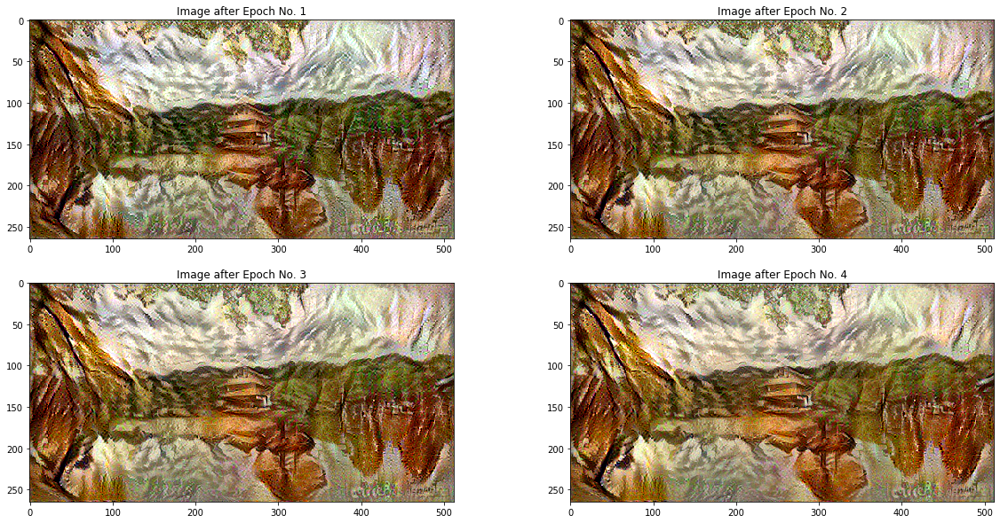

Total time: 134.4 seconds 




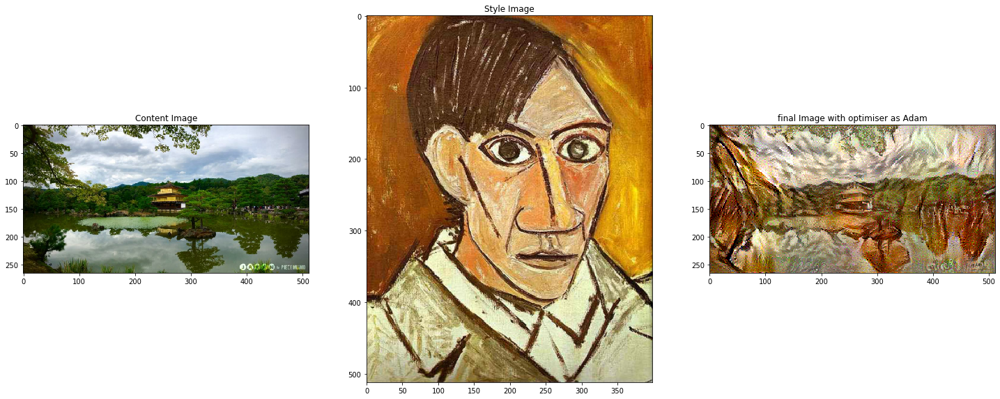

In [71]:
opt_based_trainer(image_1, opt_1,"Adam")

Epoch No. :  1
..................................................
Total time for Epoch: 33.3  seconds.

Epoch No. :  2
..................................................
Total time for Epoch: 32.6  seconds.

Epoch No. :  3
..................................................
Total time for Epoch: 32.7  seconds.

Epoch No. :  4
..................................................
Total time for Epoch: 32.6  seconds.



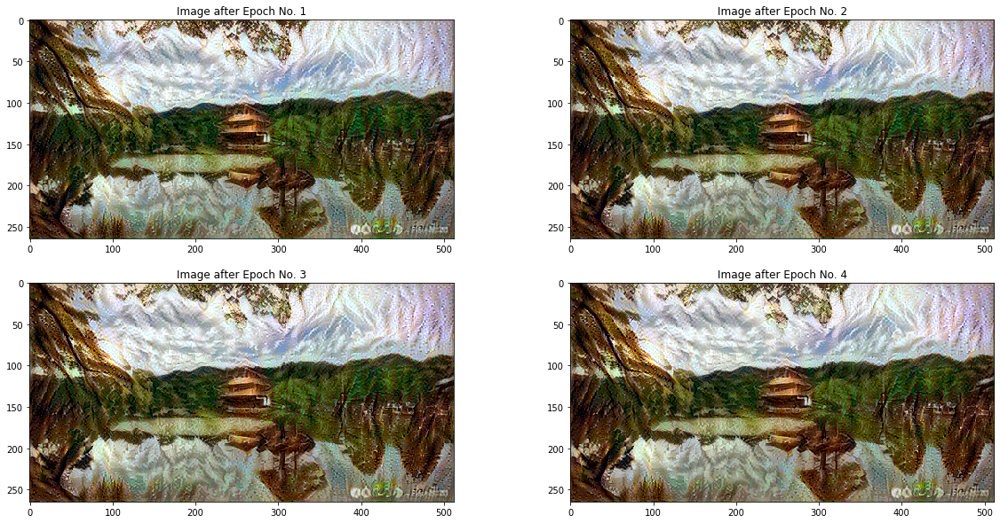

Total time: 134.7 seconds 




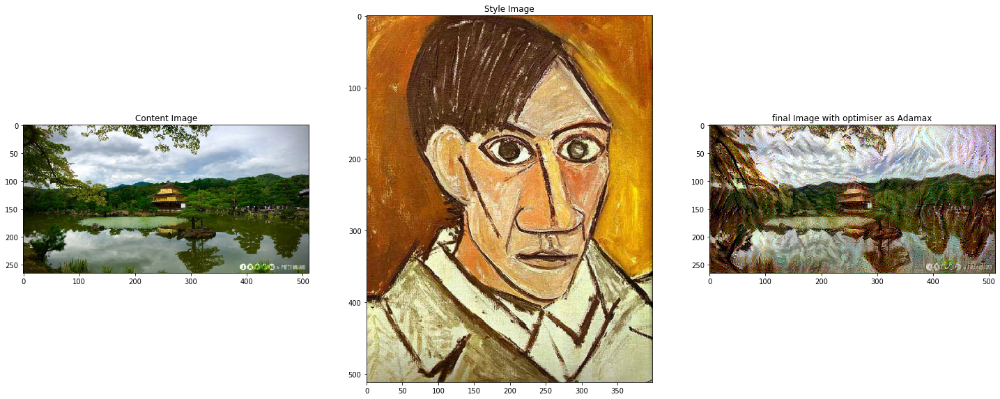

In [73]:
opt_based_trainer(image_2, opt_2,"Adamax")

Epoch No. :  1
..................................................
Total time for Epoch: 34.1  seconds.

Epoch No. :  2
..................................................
Total time for Epoch: 32.8  seconds.

Epoch No. :  3
..................................................
Total time for Epoch: 32.8  seconds.

Epoch No. :  4
..................................................
Total time for Epoch: 32.8  seconds.



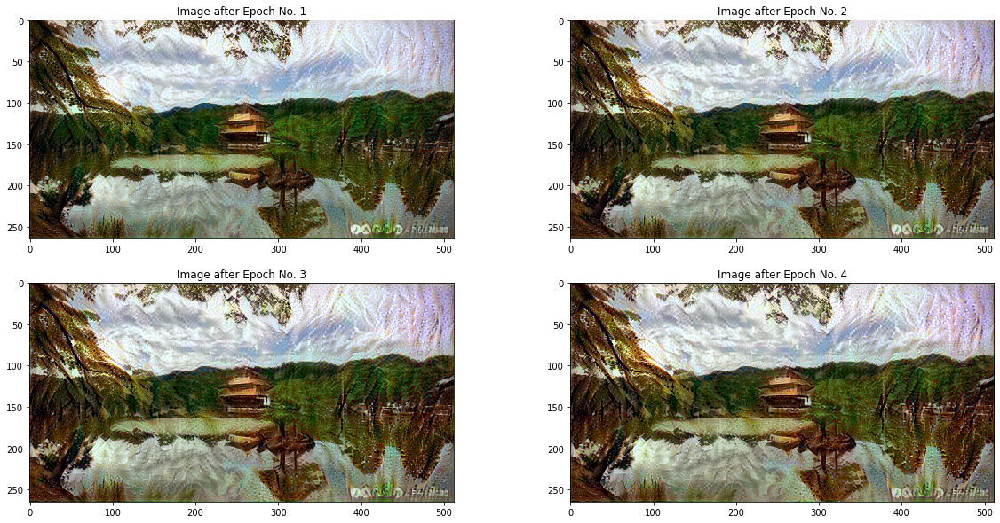

Total time: 136.1 seconds 




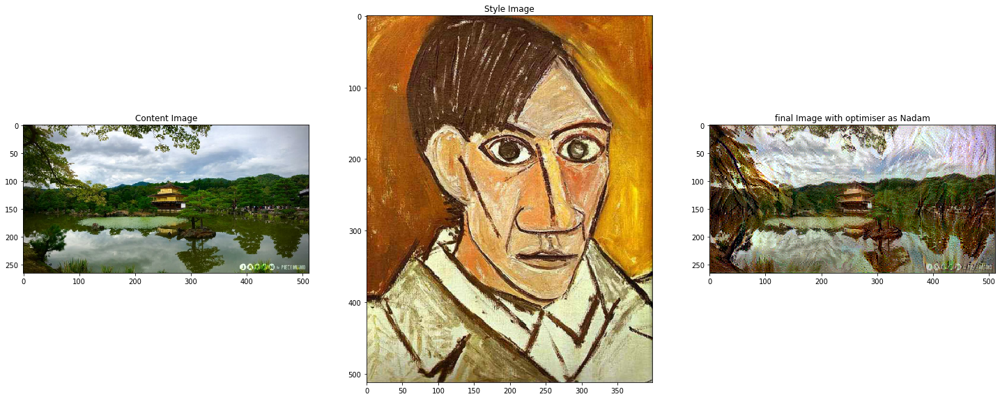

In [75]:
opt_based_trainer(image_3, opt_3,"Nadam")

Epoch No. :  1
..................................................
Total time for Epoch: 33.9  seconds.

Epoch No. :  2
..................................................
Total time for Epoch: 32.7  seconds.

Epoch No. :  3
..................................................
Total time for Epoch: 32.7  seconds.

Epoch No. :  4
..................................................
Total time for Epoch: 32.8  seconds.



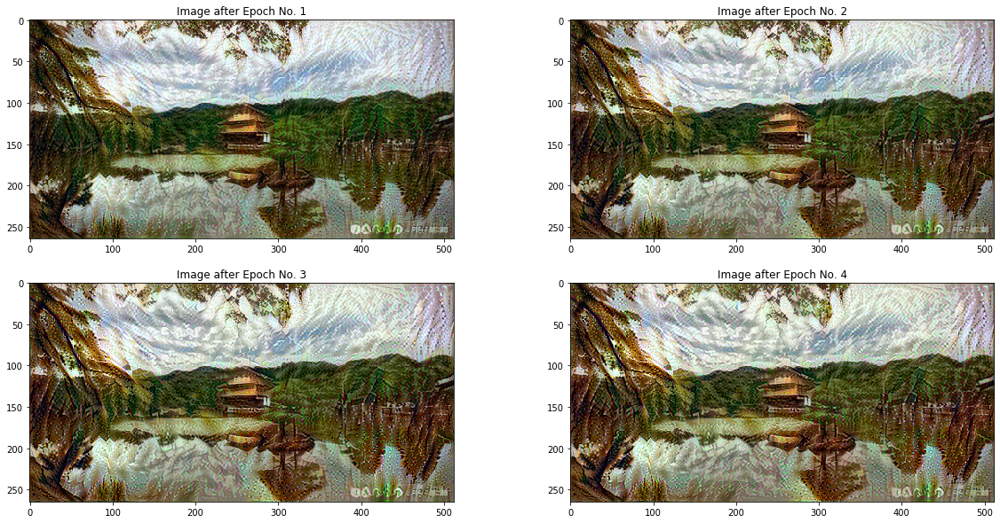

Total time: 135.6 seconds 




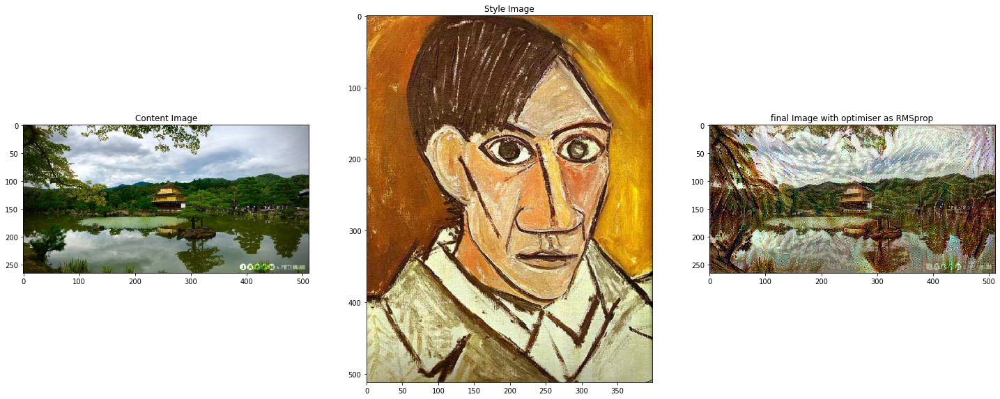

In [77]:
opt_based_trainer(image_4, opt_4,"RMSprop")